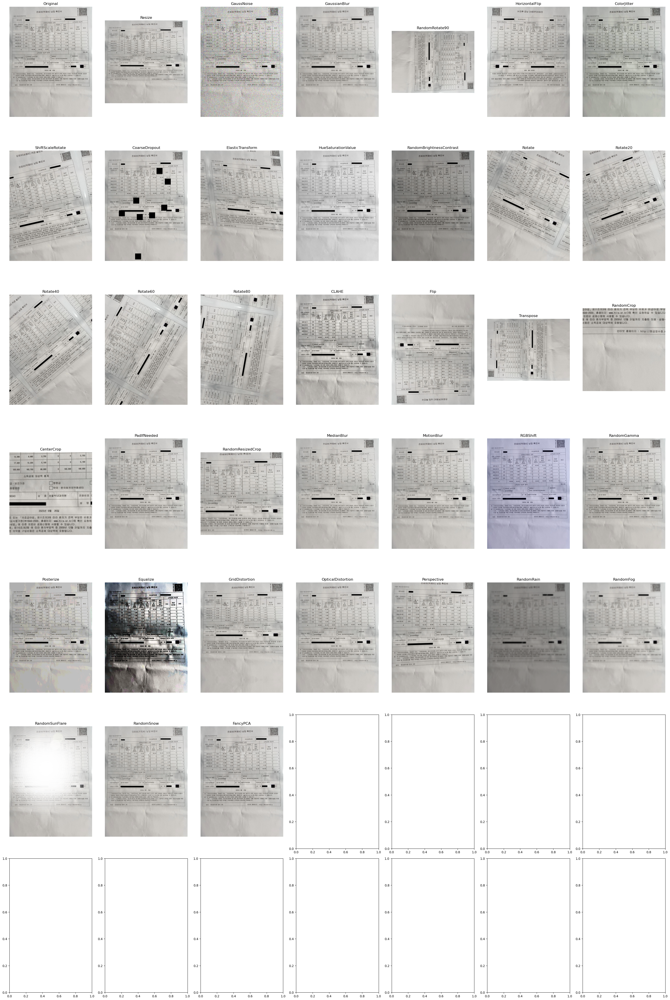

In [5]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from albumentations import (
    Compose, Resize, OneOf, GaussNoise, GaussianBlur, RandomRotate90,
    HorizontalFlip, ColorJitter, ShiftScaleRotate, CoarseDropout,
    ElasticTransform, HueSaturationValue, RandomBrightnessContrast,
    Rotate, Normalize, CLAHE, InvertImg, Solarize, Flip, Transpose,
    RandomCrop, CenterCrop, PadIfNeeded, RandomResizedCrop, MedianBlur,
    MotionBlur, RGBShift, RandomGamma, Posterize, Equalize, GridDistortion,
    OpticalDistortion, PiecewiseAffine, Perspective, RandomShadow,
    RandomRain, RandomFog, RandomSunFlare, RandomSnow, RandomGridShuffle,
    FancyPCA
)
from albumentations.pytorch import ToTensorV2
import albumentations as A

# Load the image
img_path = '//Users/choesumin/Documents/upstage/data/train/0ad5ad8a888027e0.jpg'
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Define the transformation
transformations = {
    "Original": None,
    "Resize": Resize(height=256, width=256),
    "GaussNoise": GaussNoise(var_limit=(10.0, 1000.0), p=1),
    "GaussianBlur": GaussianBlur(blur_limit=(3, 5), p=1),
    "RandomRotate90": RandomRotate90(p=1),
    "HorizontalFlip": HorizontalFlip(p=1),
    "ColorJitter": ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2, p=1),
    "ShiftScaleRotate": ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, p=1),
    "CoarseDropout": CoarseDropout(max_holes=8, max_height=32, max_width=32, p=1),
    "ElasticTransform": ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=1),
    "HueSaturationValue": HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=1),
    "RandomBrightnessContrast": RandomBrightnessContrast(brightness_limit=(-0.2, -0.1), contrast_limit=(-0.2, -0.1), p=1),
    "Rotate": Rotate(limit=30, p=1),
    "Rotate20": Rotate(limit=(20, 20), p=1),
    "Rotate40": Rotate(limit=(40, 40), p=1),
    "Rotate60": Rotate(limit=(60, 60), p=1),
    "Rotate80": Rotate(limit=(80, 80), p=1),
    "CLAHE": CLAHE(clip_limit=2.0, tile_grid_size=(8, 8), p=1),
    "Flip": Flip(p=1),
    "Transpose": Transpose(p=1),
    "RandomCrop": RandomCrop(height=224, width=224, p=1),
    "CenterCrop": CenterCrop(height=224, width=224, p=1),
    "PadIfNeeded": PadIfNeeded(min_height=300, min_width=300, p=1),
    "RandomResizedCrop": RandomResizedCrop(height=224, width=224, p=1),
    "MedianBlur": MedianBlur(blur_limit=5, p=1),
    "MotionBlur": MotionBlur(blur_limit=5, p=1),
    "RGBShift": RGBShift(r_shift_limit=20, g_shift_limit=20, b_shift_limit=20, p=1),
    "RandomGamma": RandomGamma(gamma_limit=(80, 120), p=1),
    "Posterize": Posterize(num_bits=4, p=1),
    "Equalize": Equalize(p=1),
    "GridDistortion": GridDistortion(p=1),
    "OpticalDistortion": OpticalDistortion(p=1),
    "Perspective": Perspective(p=1),
    "RandomRain": RandomRain(p=1),
    "RandomFog": RandomFog(p=1),
    "RandomSunFlare": RandomSunFlare(p=1),
    "RandomSnow": RandomSnow(p=1),
    "FancyPCA": FancyPCA(p=1),
}

# Apply and visualize the transformations
fig, axs = plt.subplots(7, 7, figsize=(30, 45))
axs = axs.flatten()

for ax, (name, transform) in zip(axs, transformations.items()):
    if transform is not None:
        augmented = transform(image=image)["image"]
    else:
        augmented = image

    if name == "Normalize and ToTensorV2":
        augmented = (augmented.permute(1, 2, 0) * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])).numpy()

    ax.imshow(augmented.astype(np.uint8))
    ax.set_title(name)
    ax.axis('off')

plt.tight_layout()
plt.show()


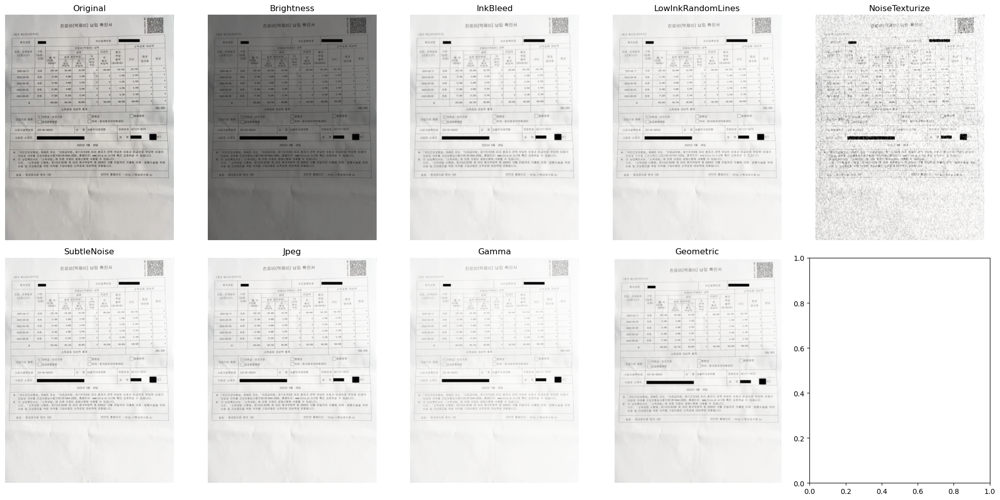

In [35]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from augraphy import *

# 이미지 로드
img_path = '//Users/choesumin/Documents/upstage/data/train/0ad5ad8a888027e0.jpg'
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Augraphy 변환 정의
transformations = {
    "Original": None,
    "Brightness": Brightness(brightness_range=(0.3, 0.8), p=1),
    "InkBleed": InkBleed(intensity_range=(0.1, 0.2), kernel_size=(5, 5), severity=(0.4, 0.6), p=1),
    "LowInkRandomLines": LowInkRandomLines(count_range=(5, 10), use_consistent_lines=False, noise_probability=0.8, p=1),
    "NoiseTexturize": NoiseTexturize(sigma_range=(10, 20), turbulence_range=(5, 10), p=1),
    "SubtleNoise": SubtleNoise(p=1),
    "Jpeg": Jpeg(quality_range=(25, 95), p=1),
    "Gamma": Gamma(gamma_range=(0.5, 1.5), p=1),
    "Geometric": Geometric(scale=(0.9, 1.1), translation=(5, 5), p=1),
}

# 변환 적용 및 시각화
fig, axs = plt.subplots(2, 5, figsize=(20, 10))
axs = axs.flatten()

for ax, (name, transform) in zip(axs, transformations.items()):
    if transform is not None:
        # 각 변환을 ink_phase에 포함하여 파이프라인 생성
        pipeline = AugraphyPipeline(ink_phase=[transform], paper_phase=[], post_phase=[])
        augmented = pipeline.augment(image)["output"]
    else:
        augmented = image

    ax.imshow(augmented.astype(np.uint8))
    ax.set_title(name)
    ax.axis('off')

plt.tight_layout()
plt.show()


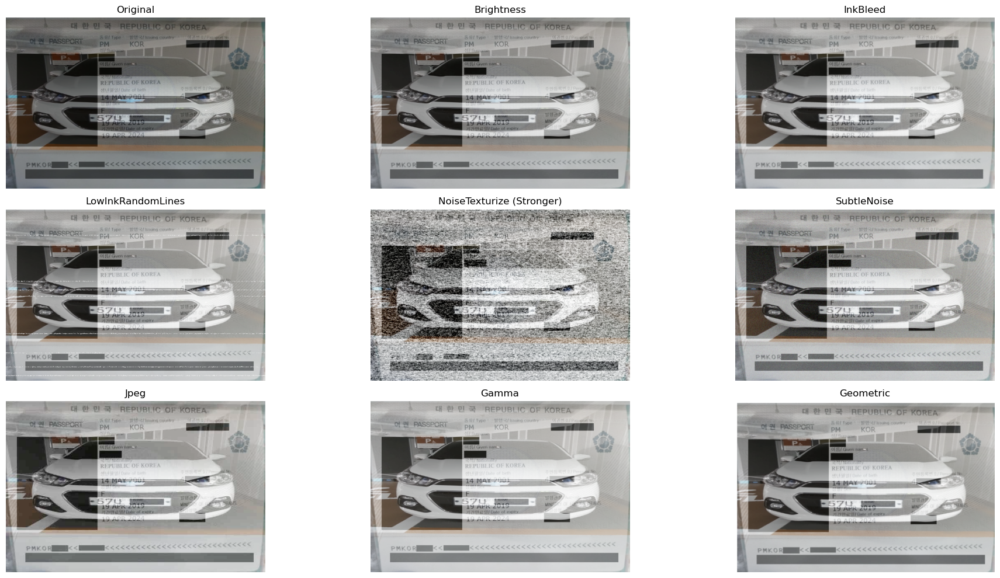

In [39]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from augraphy import *

# mixup 함수 - 크기와 채널을 일관되게 처리
def mixup(image1, image2, alpha=0.4):
    if not isinstance(image1, np.ndarray):
        image1 = np.array(image1)
    if not isinstance(image2, np.ndarray):
        image2 = np.array(image2)

    # 두 이미지 크기를 일치시킴
    if image1.shape[:2] != image2.shape[:2]:
        image2 = cv2.resize(image2, (image1.shape[1], image1.shape[0]))

    # 두 이미지를 3채널로 변환하여 일관성 유지
    if len(image1.shape) == 2:
        image1 = cv2.cvtColor(image1, cv2.COLOR_GRAY2BGR)
    if len(image2.shape) == 2:
        image2 = cv2.cvtColor(image2, cv2.COLOR_GRAY2BGR)
    
    return cv2.addWeighted(image1, alpha, image2, 1 - alpha, 0)

# 이미지 로드
img_path1 = '/Users/choesumin/Documents/upstage/data/train/0ebdd3bf7dbe63dc.jpg'
img_path2 = '/Users/choesumin/Documents/upstage/data/train/1aeb7ac256febd27.jpg'

image1 = cv2.imread(img_path1)
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

image2 = cv2.imread(img_path2)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# mixup 이미지 생성
mixed_image = mixup(image1, image2, alpha=0.4)

# Augraphy 변환 정의
transformations = {
    "Original": None,
    "Brightness": Brightness(brightness_range=(0.8, 1.2), p=1),
    "InkBleed": InkBleed(intensity_range=(0.1, 0.2), kernel_size=(5, 5), severity=(0.4, 0.6), p=1),
    "LowInkRandomLines": LowInkRandomLines(count_range=(5, 10), use_consistent_lines=False, noise_probability=0.1, p=1),
    "NoiseTexturize (Stronger)": NoiseTexturize(sigma_range=(10, 30), turbulence_range=(5, 15), p=1),
    "SubtleNoise": SubtleNoise(p=1),
    "Jpeg": Jpeg(quality_range=(25, 95), p=1),
    "Gamma": Gamma(gamma_range=(0.5, 1.5), p=1),
    "Geometric": Geometric(scale=(0.9, 1.1), translation=(5, 5), p=1),
}

# 변환 적용 및 시각화
fig, axs = plt.subplots(3, 3, figsize=(20, 10))
axs = axs.flatten()

for ax, (name, transform) in zip(axs, transformations.items()):
    if transform is not None:
        # 각 변환을 ink_phase에 포함하여 파이프라인 생성
        pipeline = AugraphyPipeline(ink_phase=[transform], paper_phase=[], post_phase=[])
        augmented = pipeline.augment(mixed_image)["output"]
    else:
        augmented = mixed_image

    ax.imshow(augmented.astype(np.uint8))
    ax.set_title(name)
    ax.axis('off')

plt.tight_layout()
plt.show()
